![BCC](https://bccfilkom.net/static/assets/images/BCC-Logo.svg)

# Rainfall Predictions

# Methodology

Our ability to use the data within the decision making process is either lost or not maximized as all too often, **we don't have a solid understanding of the questions being asked** and how to apply the data correctly to the problem at hand. It's important to consider it because all too often there is a temptation to bypass methodology and jump directly to solutions.

Let's start with explaining what a methodology is. *Methodology* is a system of methods used in a particular area of study or activity.

So in this project, I will be using methodology called *Foundational Methodology for Data Science*.

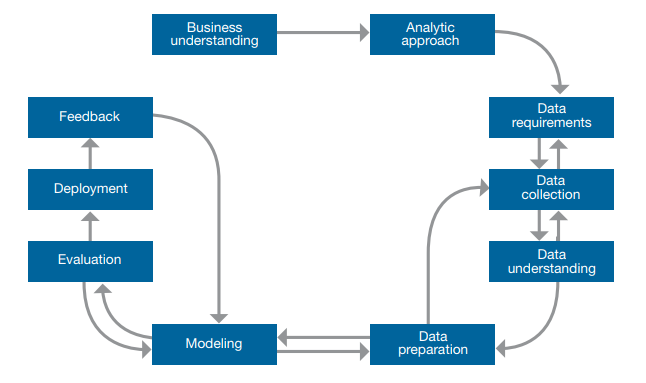

# Business understanding

.

# Analytic approach

.

# Data collection

In [1]:
import warnings
warnings.filterwarnings('ignore')

# Basic Library
import warnings
import os
import numpy as np
np.random.seed(7)
import pandas as pd
import statistics
import math
from timeit import default_timer as timer

# Preprocessing Library
#!pip install missingno
#import missingno as msno
from sklearn import metrics
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MinMaxScaler
import vtreat
from scipy.stats.mstats import winsorize

# Visualization Library
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from scipy import stats
import missingno as mno

#import matplotlib.pylab as pylab

# Fast EDA
from dataprep.eda import create_report

# Dimentionality Reduction & Normalization Library
#from sklearn.preprocessing import normalize
#from sklearn.preprocessing import MinMaxScaler
#from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Machine Learning Library
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
import pickle
#!pip install pycaret
import pycaret

# Model Evaluation Library
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
#from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


# Library setting
# Set the display option to show all columns
pd.set_option('display.max_columns', None)

In [2]:
# Downgrading numpy to 1.23 for shap
#!pip install numpy==1.23

In [3]:
# Check the version
print(f'Matplotlib: {matplotlib.__version__}')
print(f'pandas: {pd.__version__}')
print(f'numpy: {np.__version__}')

Matplotlib: 3.7.2
pandas: 1.5.3
numpy: 1.23.5


In [4]:
# Get all files in the designated directory
directory_path = r"D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23"

for dirpath, _, filenames in os.walk(directory_path):
    for filename in filenames:
        print(os.path.join(dirpath, filename))

D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.gitignore
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\README.md
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\COMMIT_EDITMSG
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\config
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\description
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\FETCH_HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\index
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\ORIG_HEAD
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\packed-refs
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\applypatch-msg.sample
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\commit-msg.sample
D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\.git\hooks\fsmonito

In [5]:
# Use double backslashes or forward slashes in the file path
TRAIN_PATH = r'D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\datasets\train.csv'
TEST_PATH = r'D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\datasets\test.csv'
SAMPLE_SUBMISSION_PATH = r'D:\[03] Work & Project\[01] Active Development\AIRNOLOGY-23\datasets\sample_submission.csv'

# Read the CSV file into a DataFrame
train_dat = pd.read_csv(TRAIN_PATH)
test_dat = pd.read_csv(TEST_PATH)

# Data preparation I

In [6]:
# Check unique value
cols = train_dat.columns

for col in cols:
    print(f"{col} \t\n-> number of unique val: {train_dat[col].nunique()} \n-> unique val: {train_dat[col].unique()} \n -------------------------------- \n")

datetime 	
-> number of unique val: 341880 
-> unique val: [ 283996800  284000400  284004000 ... 1514754000 1514757600 1514761200] 
 -------------------------------- 

datetime_iso 	
-> number of unique val: 341880 
-> unique val: ['1979-01-01 00:00:00+00:00' '1979-01-01 01:00:00+00:00'
 '1979-01-01 02:00:00+00:00' ... '2017-12-31 21:00:00+00:00'
 '2017-12-31 22:00:00+00:00' '2017-12-31 23:00:00+00:00'] 
 -------------------------------- 

time-zone 	
-> number of unique val: 1 
-> unique val: [28800] 
 -------------------------------- 

temp 	
-> number of unique val: 9406 
-> unique val: ['24.75 Celcius' '24.58 C' '26.6 Celcius' ... '136.06 °C' '33.48 Celcius'
 '34.32 C'] 
 -------------------------------- 

visibility 	
-> number of unique val: 12 
-> unique val: [nan 'unidentified' ' ' '-1m' 'unrecognized' 'unknown' '-1 km' '-1'
 'empty' 'undefined' '-1km' '-1 m' 'missing'] 
 -------------------------------- 

d_point 	
-> number of unique val: 6121 
-> unique val: ['23.89  C' '23.

In [7]:
train_dat.iloc[:5]

,datetime,datetime_iso,time-zone,temp,visibility,d_point,feels,min_temp,max_temp,prssr,sea_level,grnd_level,hum,wind_spd,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds
0,283996800,1979-01-01 00:00:00+00:00,28800,24.75 Celcius,NaN,23.89 C,25.76 C,24.28,25.22°C,1012,undetermined,NaN,95,0.82,320.0 °,zero,0,NaN,NaN,100
1,284000400,1979-01-01 01:00:00+00:00,28800,24.58 C,NaN,23.73 C,25.57 C,23.99 C,25.26 C,1012,NaN,NaN,95,0.96 m/s,338.0°,0,0,0,0,100
2,284004000,1979-01-01 02:00:00+00:00,28800,26.6 Celcius,unidentified,24.06 C,26.6 C,26.1 C,27.39,1012,NaN,undetermined,86,1.22 m/s,339.0°,0,volume:zero,NaN,NaN,99
3,284007600,1979-01-01 03:00:00+00:00,28800,27.31 Celcius,NaN,24.37 C,30.9 C,26.59,28.36 C,1012,NaN,undetermined,84,1.08 m/s,342,0.13,nol,0,NaN,94
4,284011200,1979-01-01 04:00:00+00:00,28800,27.41,NaN,25.05 C,31.54 C,26.58 C,28.31 °C,1011,NaN,undetermined,87,0.86,336.0°,0.34,nol,NaN,0,100


In [8]:
# datetime -> tiap sample data nambah 3600, unnecessary
train_dat.drop(columns=["datetime"], inplace=True)
test_dat.drop(columns=["datetime"], inplace=True)

# Convert the 'datetime_iso' column to a datetime object
train_dat['datetime_iso'] = pd.to_datetime(train_dat['datetime_iso'])
test_dat['datetime_iso'] = pd.to_datetime(test_dat['datetime_iso'])

# Extract year, month, day, and hour
train_dat['year'] = train_dat['datetime_iso'].dt.year
train_dat['month'] = train_dat['datetime_iso'].dt.month
train_dat['day'] = train_dat['datetime_iso'].dt.day
train_dat['hour'] = train_dat['datetime_iso'].dt.hour
#train_dat['minute'] = train_dat['datetime_iso'].dt.minute
#train_dat['second'] = train_dat['datetime_iso'].dt.second

test_dat['year'] = test_dat['datetime_iso'].dt.year
test_dat['month'] = test_dat['datetime_iso'].dt.month
test_dat['day'] = test_dat['datetime_iso'].dt.day
test_dat['hour'] = test_dat['datetime_iso'].dt.hour
#test_dat['minute'] = train_dat['datetime_iso'].dt.minute
#test_dat['second'] = train_dat['datetime_iso'].dt.second

# `datetime_iso` jangan di drop dulu buat feature engineering
#train_dat.drop(columns=["datetime_iso"], inplace=True)
#test_dat.drop(columns=["datetime_iso"], inplace=True)

# time-zone -> dihapus karena data bukan unique
train_dat.drop(columns=["time-zone"], inplace=True)
test_dat.drop(columns=["time-zone"], inplace=True)

# temp
def prep_temp(temp):
    if isinstance(temp, str) :
        temp = temp.replace("Celcius", "")
        temp = temp.replace("C", "")
        temp = temp.replace("°", "")
        temp = temp.strip()
    return temp

# visibility


# prssr
def prep_prssr(prssr):
    if isinstance(prssr, str):
        prssr = prssr.replace("hPa.", "")
        prssr = prssr.replace("hPa", "")
        prssr = prssr.strip()
    return prssr

# sea_level

# grnd_level

# hum
def prep_hum(hum):
    if isinstance(hum, str):
        hum = hum.replace("%", "")
        hum = hum.strip()
    return hum

# wind_spd & wind_deg
def prep_wind(wind):
    if isinstance(wind, str):
        wind = wind.replace("m/s", "")
        wind = wind.replace("°", "")
        wind = wind.strip()
    return wind

# rain_1h
def prep_rain_1h(rain):
    if isinstance(rain, str):
        rain = rain.replace("mm", "")
        rain = rain.replace("zero", "0")
        rani = rain.replace(" ", "0")
        rain = rain.strip()
        try:
            float(rain)
            return rain
        except:
            new_rain = 0
            return new_rain
    return rain

# rain_3h -> 0 artinya ga hujan
def prep_rain_3h(rain):
    if isinstance(rain, str):
        rain = rain.replace("milimeter", "")
        rain = rain.replace("mm", "")
        rain = rain.replace("no-rain", "0")
        rain = rain.replace("volume:0", "0")
        rain = rain.replace("nol", "0")
        rain = rain.replace("no_rain", "0")
        rain = rain.replace("volume:zero", "0")
        rain = rain.replace("zero", "0")
        rain = rain.strip()
    return rain

# snow_1h
def prep_snow(snow):
    if isinstance(snow, str):
        snow = snow.replace("milimeter", "")
        snow = snow.replace("mm", "")
        snow = snow.replace("no-snow", "0")
        snow = snow.replace("volume:0", "0")
        snow = snow.replace("nol", "0")
        snow = snow.replace("no_snow", "0")
        snow = snow.replace("volume:zero", "0")
        snow = snow.replace("zero", "0")
        snow = snow.strip()
    return snow

# clouds
def prep_clouds(clouds):
    if isinstance(clouds, str):
        clouds = clouds.replace("%", "")
        clouds = clouds.strip()
    return clouds

In [9]:
preped_train = train_dat.copy()
preped_test = test_dat.copy()

# Prepping temp column --> including temp, d_point, feels, min_temp, max_temp
for column in ['temp','d_point','feels','min_temp','max_temp']:
    preped_train[column] = preped_train[column].apply(lambda x: prep_temp(x))
    preped_test[column] = preped_test[column].apply(lambda x: prep_temp(x))

# Prepping prssr column
for column in ['prssr']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_prssr(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_prssr(x))

# Prepping hum column
for column in ['hum']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_hum(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_hum(x))

# Prepping wind column --> including wind_spd, wind_deg
for column in ['wind_spd', 'wind_deg']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_wind(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_wind(x))

# Prepping rain_1h
for column in ['rain_1h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_rain_1h(x))

# Prepping rain_3h column
for column in ['rain_3h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_rain_3h(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_rain_3h(x))

# Prepping snow column --> including snow_1h, snow_3h
for column in ['snow_1h', 'snow_3h']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_snow(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_snow(x))

# Prepping clunds column
for column in ['clouds']:
    preped_train[column] = preped_train[column].apply(lambda x:prep_clouds(x))
    preped_test[column] = preped_test[column].apply(lambda x:prep_clouds(x))

In [10]:
# Check unique value
cols = preped_train.columns

for col in cols:
    print(f"{col} \t\n-> number of unique val: {preped_train[col].nunique()} \n-> unique val: {preped_train[col].unique()} \n  --------------------------------  \n")

datetime_iso 	
-> number of unique val: 341880 
-> unique val: <DatetimeArray>
['1979-01-01 00:00:00+00:00', '1979-01-01 01:00:00+00:00',
 '1979-01-01 02:00:00+00:00', '1979-01-01 03:00:00+00:00',
 '1979-01-01 04:00:00+00:00', '1979-01-01 05:00:00+00:00',
 '1979-01-01 06:00:00+00:00', '1979-01-01 07:00:00+00:00',
 '1979-01-01 08:00:00+00:00', '1979-01-01 09:00:00+00:00',
 ...
 '2017-12-31 14:00:00+00:00', '2017-12-31 15:00:00+00:00',
 '2017-12-31 16:00:00+00:00', '2017-12-31 17:00:00+00:00',
 '2017-12-31 18:00:00+00:00', '2017-12-31 19:00:00+00:00',
 '2017-12-31 20:00:00+00:00', '2017-12-31 21:00:00+00:00',
 '2017-12-31 22:00:00+00:00', '2017-12-31 23:00:00+00:00']
Length: 341880, dtype: datetime64[ns, UTC] 
  --------------------------------  

temp 	
-> number of unique val: 2206 
-> unique val: ['24.75' '24.58' '26.6' ... '158.6' '159.75' '34.32'] 
  --------------------------------  

visibility 	
-> number of unique val: 12 
-> unique val: [nan 'unidentified' ' ' '-1m' 'unrecogniz

## Making sure the datatypes are correct

* Numerical columns --> int or float
* Categorical columns --> categorical

In [11]:
preped_train.dtypes

datetime_iso    datetime64[ns, UTC]
temp                         object
visibility                   object
d_point                      object
feels                        object
min_temp                     object
max_temp                     object
prssr                        object
sea_level                    object
grnd_level                   object
hum                          object
wind_spd                     object
wind_deg                     object
rain_1h                      object
rain_3h                      object
snow_1h                      object
snow_3h                      object
clouds                       object
year                          int64
month                         int64
day                           int64
hour                          int64
dtype: object

In [12]:
preped_test.dtypes

datetime_iso    datetime64[ns, UTC]
temp                         object
visibility                   object
d_point                      object
feels                        object
min_temp                     object
max_temp                     object
prssr                        object
sea_level                    object
grnd_level                   object
hum                          object
wind_spd                     object
wind_deg                     object
rain_3h                      object
snow_1h                      object
snow_3h                      object
clouds                       object
year                          int64
month                         int64
day                           int64
hour                          int64
dtype: object

* `temp` should be numerical(float).
* `visibility` should be normal categorical --> tetapi ada kemungkinan ordered categorical.
* `d_point` should be numerical(float).
* `feels` should be numerical(float).
* `min_temp` should be numerical(float).
* `max_temp` should be numerical(float).
* `prssr` should be numerical(float).
* `hum` should be numerical(float).
* `wind_spd` should be numerical(float).
* `wind_deg` should be numerical(float).
* `rain_1h` should be numerical(float) --> target variable.
* `rain_3h` should be numerical(float).
* `snow_1h` should be numerical(float).
* `snow_3h` should be numerical(float).
* `clouds` should be numerical(float).
* `year` should be normal categorical.
* `month` should be normal categorical.
* `hour` should be normal categorical.

In [13]:
# Changing to `category` data type for normal categorical data

cat_cols = ['visibility','sea_level', 'grnd_level', 'year', 'month', 'day', 'hour']

preped_train[cat_cols] = preped_train[cat_cols].astype('category')
preped_test[cat_cols] = preped_train[cat_cols].astype('category')

# Changing to 'float' for numerical data

# di num_cols_test ga ada rain_1h
num_cols_train = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'wind_deg', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds']
num_cols_test = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'wind_deg', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds']

preped_train[num_cols_train] = preped_train[num_cols_train].astype('float')
preped_test[num_cols_test] = preped_test[num_cols_test].astype('float')

In [14]:
preped_train.dtypes

datetime_iso    datetime64[ns, UTC]
temp                        float64
visibility                 category
d_point                     float64
feels                       float64
min_temp                    float64
max_temp                    float64
prssr                       float64
sea_level                  category
grnd_level                 category
hum                         float64
wind_spd                    float64
wind_deg                    float64
rain_1h                     float64
rain_3h                     float64
snow_1h                     float64
snow_3h                     float64
clouds                      float64
year                       category
month                      category
day                        category
hour                       category
dtype: object

In [15]:
preped_test.dtypes

datetime_iso    datetime64[ns, UTC]
temp                        float64
visibility                 category
d_point                     float64
feels                       float64
min_temp                    float64
max_temp                    float64
prssr                       float64
sea_level                  category
grnd_level                 category
hum                         float64
wind_spd                    float64
wind_deg                    float64
rain_3h                     float64
snow_1h                     float64
snow_3h                     float64
clouds                      float64
year                       category
month                      category
day                        category
hour                       category
dtype: object

# Data understanding

## Fast EDA

### DataPrep

### ydata_profiling

## Descriptive Statistics

In [16]:
# statistics of numerical columns
preped_train.select_dtypes(exclude='object').describe().T

,count,mean,std,min,25%,50%,75%,max
temp,341880.0,28.296996,13.325830,21.55,24.98,26.20,28.39,177.26
d_point,341880.0,26.056234,12.080483,13.96,23.95,24.57,25.24,141.59
feels,341880.0,31.092778,15.228520,22.35,25.99,26.65,33.37,202.71
min_temp,341880.0,27.483902,12.924432,14.12,24.25,25.48,27.64,162.92
max_temp,341880.0,29.359565,13.802332,22.37,25.97,27.27,29.31,187.17
prssr,341880.0,1070.965439,494.701076,1001.00,1009.00,1010.00,1011.00,5115.51
hum,341880.0,94.221361,44.888444,29.00,83.00,92.00,96.00,503.00
wind_spd,341880.0,1.474819,1.104015,0.00,0.88,1.27,1.80,25.00
wind_deg,341880.0,210.867372,147.667380,0.00,149.00,203.00,279.00,1810.80
rain_1h,341880.0,0.338298,0.953114,-1.00,0.00,0.00,0.23,27.10


- `temp` --> max mencapai 177 which is impossible
- `rain_1h` --> seharusnya tidak boleh mencapai angka -1.00
- `prssr` --> mean berada di nilai 1070 namun terdapat beberapa record data yang mencapai nilai ~5000

## Univariate Analysis

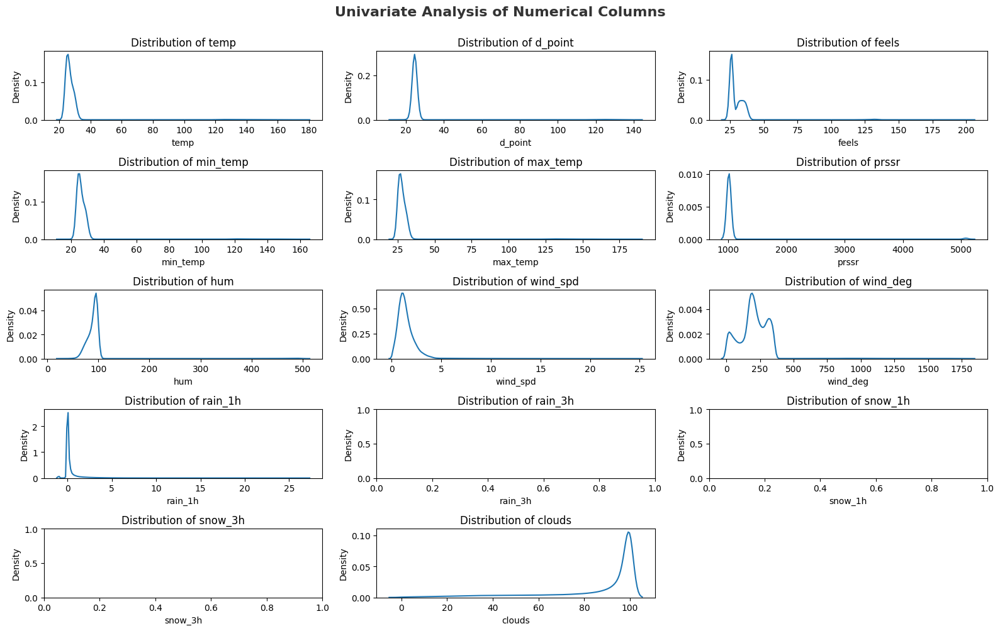

In [17]:
def univariate_analysis(preped_train, height=10):
    # Filter the DataFrame to include only numerical columns
    numerical_columns = preped_train.select_dtypes(include=['number'])
    
    # Determine the number of rows and columns for subplots dynamically
    num_numerical_cols = len(numerical_columns.columns)
    num_subplot_cols = 3  # Number of columns for subplots
    
    num_subplot_rows = (num_numerical_cols + num_subplot_cols - 1) // num_subplot_cols  # Calculate number of rows
    
    # Create subplots
    plt.figure(figsize=(16, height))
    plt.suptitle('Univariate Analysis of Numerical Columns', fontsize=16, fontweight='bold', alpha=0.8, y=1.)
    for i, column in enumerate(numerical_columns.columns):
        plt.subplot(num_subplot_rows, num_subplot_cols, i + 1)
        sns.kdeplot(data=numerical_columns[column])
        plt.title(f'Distribution of {column}')
    
    plt.tight_layout()
    plt.show()

univariate_analysis(preped_train, height=10)

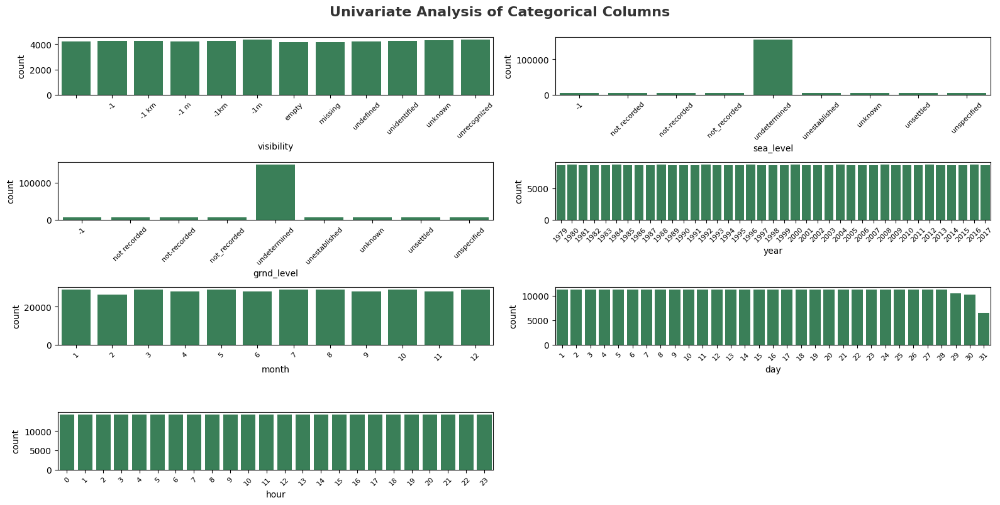

In [18]:
# categorical columns
plt.figure(figsize=(16, 8))
plt.suptitle('Univariate Analysis of Categorical Columns', fontsize=16, fontweight='bold', alpha=0.8, y=1.)
num_cat_cols = len(cat_cols)
num_rows = (num_cat_cols + 1) // 2  # Calculate the number of rows needed for 2 columns
for i in range(0, num_cat_cols):
    plt.subplot(num_rows, 2, i+1)  # Use 2 columns
    sns.countplot(x=preped_train[cat_cols[i]], color='seagreen')
    plt.xticks(rotation=45, fontsize=8)  # Rotate x-axis labels by 45 degrees and set fontsize
    plt.tight_layout()

# If there are more than 6 categorical columns, you can decide how to handle them.
# The number of rows will adjust accordingly for 2 columns.

<Axes: >

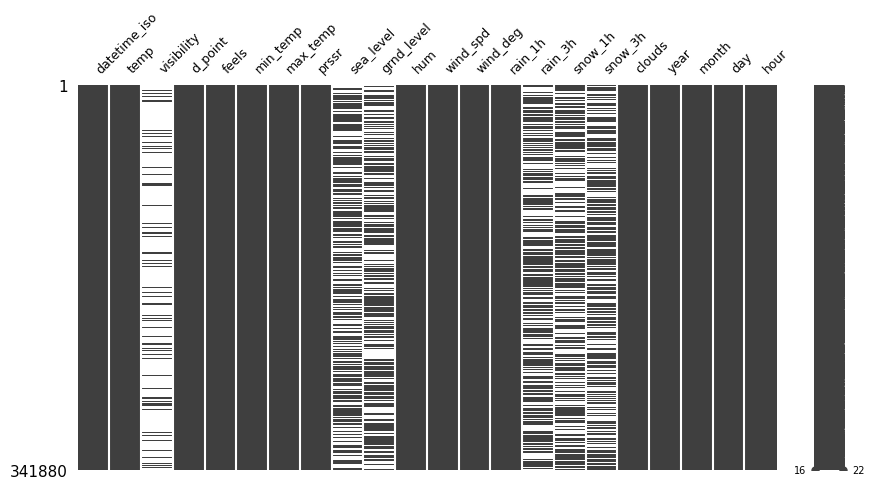

In [19]:
mno.matrix(preped_train, figsize=(10, 5), fontsize=9)

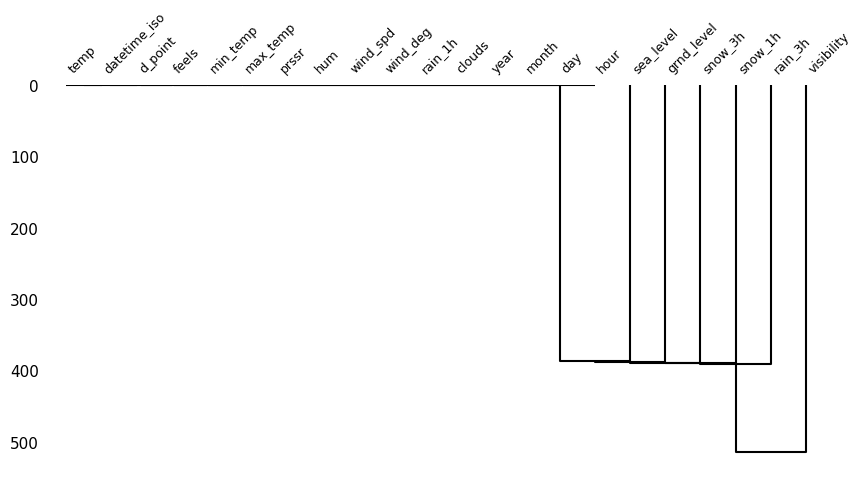

In [20]:
mno.dendrogram(preped_train, figsize=(10,5), fontsize=9);

<Axes: >

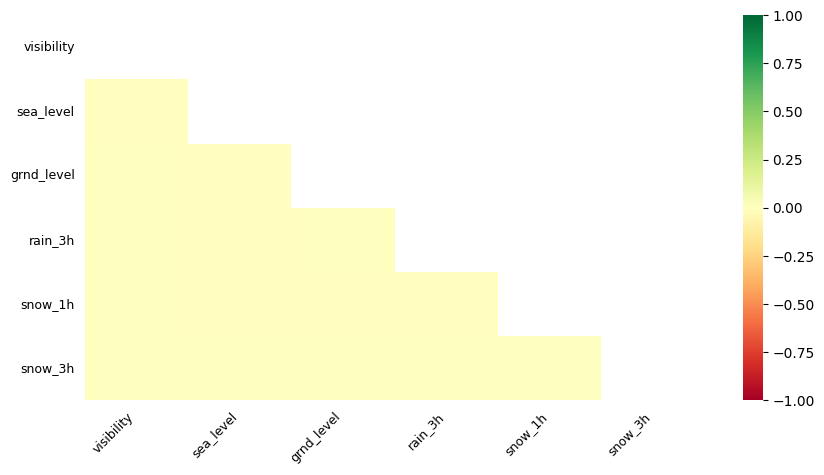

In [21]:
mno.heatmap(preped_train, cmap="RdYlGn", figsize=(10, 5), fontsize=9)

# Data preparation II

## Pay attention to the dataset before and after

In [22]:
preped_train.shape

(341880, 22)

In [23]:
preped_train.iloc[:3]

,datetime_iso,temp,visibility,d_point,feels,min_temp,max_temp,prssr,sea_level,grnd_level,hum,wind_spd,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds,year,month,day,hour
0,1979-01-01 00:00:00+00:00,24.75,NaN,23.89,25.76,24.28,25.22,1012.0,undetermined,NaN,95.0,0.82,320.0,0.0,0.0,NaN,NaN,100.0,1979,1,1,0
1,1979-01-01 01:00:00+00:00,24.58,NaN,23.73,25.57,23.99,25.26,1012.0,NaN,NaN,95.0,0.96,338.0,0.0,0.0,0.0,0.0,100.0,1979,1,1,1
2,1979-01-01 02:00:00+00:00,26.60,unidentified,24.06,26.60,26.10,27.39,1012.0,NaN,undetermined,86.0,1.22,339.0,0.0,0.0,NaN,NaN,99.0,1979,1,1,2


In [24]:
preped_test.iloc[:3]

,datetime_iso,temp,visibility,d_point,feels,min_temp,max_temp,prssr,sea_level,grnd_level,hum,wind_spd,wind_deg,rain_3h,snow_1h,snow_3h,clouds,year,month,day,hour
0,2018-01-01 00:00:00+00:00,26.59,NaN,23.66,26.59,26.02,27.16,1009.0,undetermined,NaN,84.0,1.45,355.0,0.0,NaN,0.0,97.0,1979,1,1,0
1,2018-01-01 01:00:00+00:00,26.51,NaN,24.92,26.51,26.06,28.04,1009.0,NaN,NaN,91.0,1.67,351.0,0.0,0.0,0.0,95.0,1979,1,1,1
2,2018-01-01 02:00:00+00:00,28.68,unidentified,25.71,34.68,28.03,29.30,1009.0,NaN,undetermined,84.0,1.72,345.0,0.0,0.0,0.0,90.0,1979,1,1,2


## Feature Engineering

In [25]:
# datetime feature engineering
# days of the week
cycle = 7
preped_train['weekday_sin'] = np.sin(2 * np.pi * preped_train['datetime_iso'].dt.dayofweek / cycle)
preped_train['weekday_cos'] = np.cos(2 * np.pi * preped_train['datetime_iso'].dt.dayofweek / cycle)
preped_test['weekday_sin'] = np.sin(2 * np.pi * preped_test['datetime_iso'].dt.dayofweek / cycle)
preped_test['weekday_cos'] = np.cos(2 * np.pi * preped_test['datetime_iso'].dt.dayofweek / cycle)

# Create a mapping of months to seasons (dry and wet)
month_to_season = {
    1: 'wet',   # January
    2: 'wet',   # February
    3: 'wet',   # March
    4: 'wet',   # April
    5: 'dry',   # May (Start of dry season)
    6: 'dry',   # June
    7: 'dry',   # July
    8: 'dry',   # August
    9: 'dry',   # September
    10: 'wet',  # October
    11: 'wet',  # November
    12: 'wet'   # December
}

# Map the month to the season for each datetime value
preped_train['season'] = preped_train['datetime_iso'].dt.month.map(month_to_season)
preped_test['season'] = preped_test['datetime_iso'].dt.month.map(month_to_season)

# Create binary indicator columns for dry and wet seasons
preped_train['dry_season'] = (preped_train['season'] == 'dry').astype(int)
preped_train['wet_season'] = (preped_train['season'] == 'wet').astype(int)
preped_test['dry_season'] = (preped_test['season'] == 'dry').astype(int)
preped_test['wet_season'] = (preped_test['season'] == 'wet').astype(int)

# Karena datetime_iso sekiranya sudah ga dipake, di drop
preped_train.drop(columns=["datetime_iso"], inplace=True)
preped_test.drop(columns=["datetime_iso"], inplace=True)

# feature engineering : cloudy => 1 if yes (>70), 0 if no (<=70) 
preped_train['cloudy'] = preped_train['clouds'].apply(lambda x: 1 if x > 70 else 0)
preped_test['cloudy'] = preped_test['clouds'].apply(lambda x: 1 if x > 70 else 0)

# feature engineering : temp_range => max_temp - min_temp
preped_train['temp_range'] = preped_train['max_temp'] - preped_train['min_temp']
preped_test['temp_range'] = preped_test['max_temp'] - preped_test['min_temp']

# feature engineering : hot_day => 1 if yes (>25), 0 if no (<=25) 
preped_train['hot_day'] = preped_train['temp'].apply(lambda x: 1 if x > 25 else 0)
preped_test['hot_day'] = preped_test['temp'].apply(lambda x: 1 if x > 25 else 0)

# win deg nya di anu pake modulus
preped_train["wind_deg"] = preped_train["wind_deg"] \
                                .apply(lambda x: x % 360 if x > 360 else x)
preped_test["wind_deg"] = preped_test["wind_deg"] \
                                .apply(lambda x: x % 360 if x > 360 else x)

# babai rain_1h < 0
preped_train = preped_train[preped_train["rain_1h"] >= 0]

In [26]:
preped_train.shape

(336438, 29)

In [27]:
preped_train.iloc[:50]

,temp,visibility,d_point,feels,min_temp,max_temp,prssr,sea_level,grnd_level,hum,wind_spd,wind_deg,rain_1h,rain_3h,snow_1h,snow_3h,clouds,year,month,day,hour,weekday_sin,weekday_cos,season,dry_season,wet_season,cloudy,temp_range,hot_day
0,24.75,NaN,23.89,25.76,24.28,25.22,1012.0,undetermined,NaN,95.00,0.82,320.0,0.00,0.0,NaN,NaN,100.0,1979,1,1,0,0.000000,1.000000,wet,0,1,1,0.94,0
1,24.58,NaN,23.73,25.57,23.99,25.26,1012.0,NaN,NaN,95.00,0.96,338.0,0.00,0.0,0.0,0.0,100.0,1979,1,1,1,0.000000,1.000000,wet,0,1,1,1.27,0
2,26.60,unidentified,24.06,26.60,26.10,27.39,1012.0,NaN,undetermined,86.00,1.22,339.0,0.00,0.0,NaN,NaN,99.0,1979,1,1,2,0.000000,1.000000,wet,0,1,1,1.29,1
3,27.31,NaN,24.37,30.90,26.59,28.36,1012.0,NaN,undetermined,84.00,1.08,342.0,0.13,0.0,0.0,NaN,94.0,1979,1,1,3,0.000000,1.000000,wet,0,1,1,1.77,1
4,27.41,NaN,25.05,31.54,26.58,28.31,1011.0,NaN,undetermined,87.00,0.86,336.0,0.34,0.0,NaN,0.0,100.0,1979,1,1,4,0.000000,1.000000,wet,0,1,1,1.73,1
5,28.08,NaN,24.92,32.79,27.36,29.40,1010.0,NaN,NaN,83.00,0.84,7.0,3.33,NaN,NaN,NaN,100.0,1979,1,1,5,0.000000,1.000000,wet,0,1,1,2.04,1
6,28.68,NaN,24.25,33.29,27.62,31.02,1010.0,undetermined,undetermined,77.00,0.82,309.0,8.01,0.0,0.0,0.0,100.0,1979,1,1,6,0.000000,1.000000,wet,0,1,1,3.40,1
7,28.62,NaN,25.85,34.70,28.12,29.35,1010.0,NaN,not recorded,85.00,0.71,291.0,2.54,NaN,NaN,0.0,95.0,1979,1,1,7,0.000000,1.000000,wet,0,1,1,1.23,1
8,26.55,NaN,24.21,26.55,26.09,26.83,1009.0,undetermined,undetermined,87.00,0.62,285.0,1.29,0.0,0.0,NaN,97.0,1979,1,1,8,0.000000,1.000000,wet,0,1,1,0.74,1
9,26.38,NaN,24.97,26.38,25.68,29.02,1009.0,NaN,undetermined,92.00,0.44,294.0,0.39,0.0,NaN,0.0,92.0,1979,1,1,9,0.000000,1.000000,wet,0,1,1,3.34,1


## Winsorizing

In [28]:
left_skewed = ['clouds']
right_skewed = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd', 'rain_1h']
right_skewed_test = ['temp', 'd_point', 'feels', 'min_temp', 'max_temp', 'prssr', 'hum', 'wind_spd']        # tanpa rain_1h

for column in left_skewed:
    preped_train[column] = winsorize(preped_train[column], limits=[0.020, 0.000])
    preped_test[column] = winsorize(preped_test[column], limits=[0.020, 0.000])

for column in right_skewed:
    preped_train[column] = winsorize(preped_train[column], limits=[0.000, 0.010])

for column in right_skewed_test:
    preped_test[column] = winsorize(preped_test[column], limits=[0.000, 0.010])

Data distribution after winsorizing

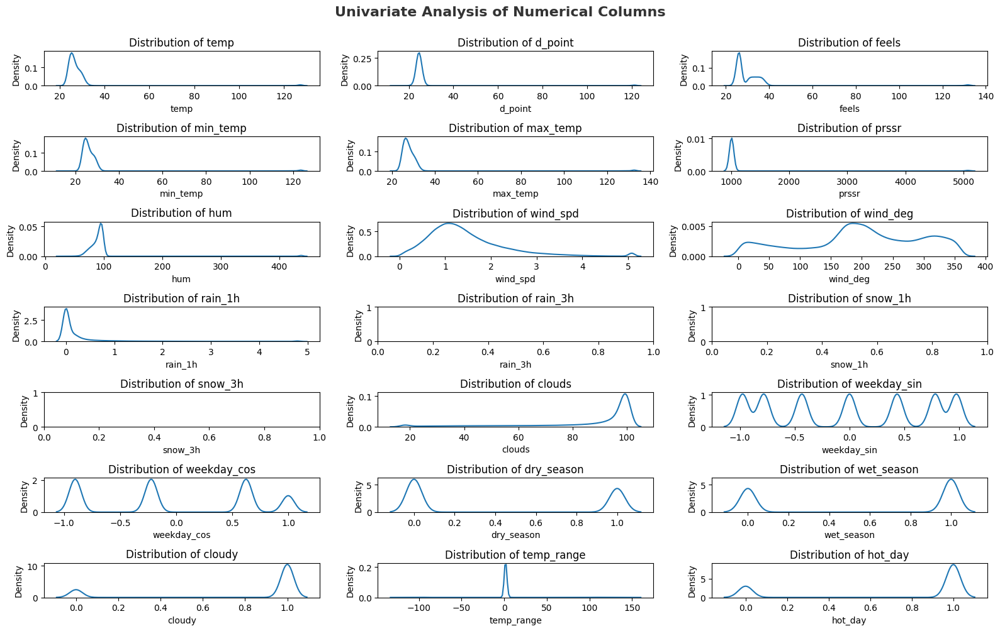

In [29]:
univariate_analysis(preped_train)

## vtreat

In [30]:
transform = vtreat.NumericOutcomeTreatment(
    outcome_name="rain_1h",
    params=vtreat.vtreat_parameters({
        "missingness_imputation": np.mean,
        "filter_to_recommended": False
    })
)

transformed_train = transform.fit_transform(preped_train)
transformed_test = transform.transform(preped_test)
transform.score_frame_

,variable,orig_variable,treatment,y_aware,has_range,PearsonR,R2,significance,vcount,default_threshold,recommended
0,visibility_is_bad,visibility,missing_indicator,False,True,0.000939,8.821060e-07,5.859133e-01,6.0,0.027778,False
1,rain_3h_is_bad,rain_3h,missing_indicator,False,True,0.001454,2.113516e-06,3.990913e-01,6.0,0.027778,False
2,snow_3h_is_bad,snow_3h,missing_indicator,False,True,-0.001527,2.330827e-06,3.758676e-01,6.0,0.027778,False
3,snow_1h_is_bad,snow_1h,missing_indicator,False,True,0.001365,1.862256e-06,4.286312e-01,6.0,0.027778,False
4,sea_level_is_bad,sea_level,missing_indicator,False,True,-0.000897,8.037550e-07,6.030556e-01,6.0,0.027778,False
5,grnd_level_is_bad,grnd_level,missing_indicator,False,True,0.001202,1.444619e-06,4.857075e-01,6.0,0.027778,False
6,weekday_cos,weekday_cos,clean_copy,False,True,-0.001863,3.470648e-06,2.798844e-01,21.0,0.007937,False
7,d_point,d_point,clean_copy,False,True,0.015993,2.557646e-04,1.746210e-20,21.0,0.007937,True
8,temp_range,temp_range,clean_copy,False,True,-0.001681,2.824436e-06,3.296577e-01,21.0,0.007937,False
9,hot_day,hot_day,clean_copy,False,True,0.091011,8.283066e-03,0.000000e+00,21.0,0.007937,True


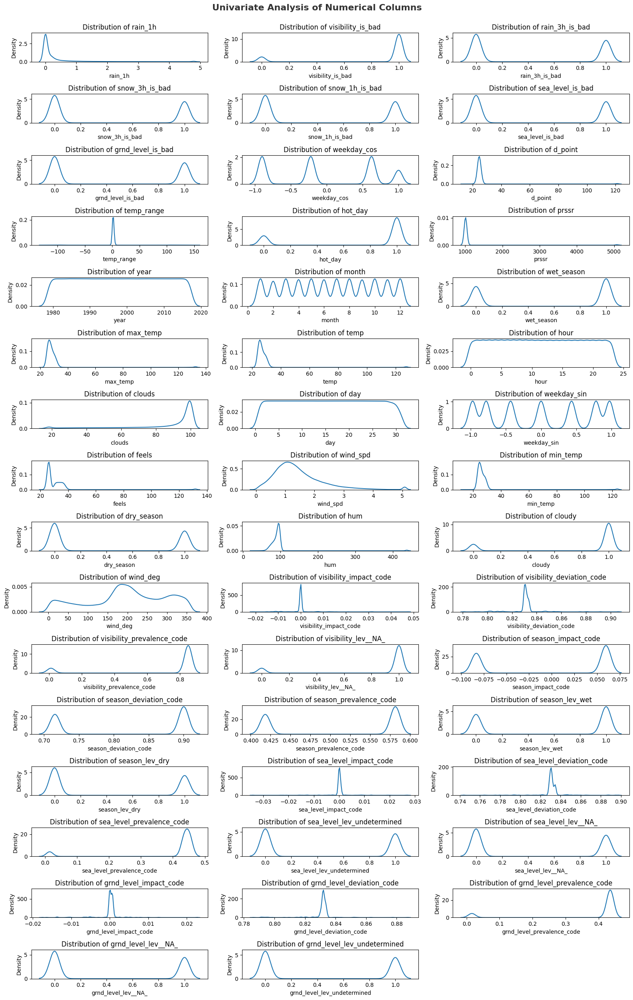

In [31]:
univariate_analysis(transformed_train, height=25)

In [32]:
transformed_train.iloc[:3]

,rain_1h,visibility_is_bad,rain_3h_is_bad,snow_3h_is_bad,snow_1h_is_bad,sea_level_is_bad,grnd_level_is_bad,weekday_cos,d_point,temp_range,hot_day,prssr,year,month,wet_season,max_temp,temp,hour,clouds,day,weekday_sin,feels,wind_spd,min_temp,dry_season,hum,cloudy,wind_deg,visibility_impact_code,visibility_deviation_code,visibility_prevalence_code,visibility_lev__NA_,season_impact_code,season_deviation_code,season_prevalence_code,season_lev_wet,season_lev_dry,sea_level_impact_code,sea_level_deviation_code,sea_level_prevalence_code,sea_level_lev_undetermined,sea_level_lev__NA_,grnd_level_impact_code,grnd_level_deviation_code,grnd_level_prevalence_code,grnd_level_lev__NA_,grnd_level_lev_undetermined
0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,23.89,0.94,0.0,1012.0,1979.0,1.0,1.0,25.22,24.75,0.0,100.0,1.0,0.0,25.76,0.82,24.28,0.0,95.0,1.0,320.0,0.000000,0.831033,0.850442,1.0,0.059750,0.900118,0.581664,1.0,0.0,-0.000066,0.830729,0.451970,1.0,0.0,0.000000,0.831858,0.435822,1.0,0.0
1,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,23.73,1.27,0.0,1012.0,1979.0,1.0,1.0,25.26,24.58,1.0,100.0,1.0,0.0,25.57,0.96,23.99,0.0,95.0,1.0,338.0,0.000000,0.832048,0.850442,1.0,0.060144,0.901235,0.581664,1.0,0.0,0.000000,0.828941,0.435747,0.0,1.0,0.000000,0.833567,0.435822,1.0,0.0
2,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,24.06,1.29,1.0,1012.0,1979.0,1.0,1.0,27.39,26.60,2.0,99.0,1.0,0.0,26.60,1.22,26.10,0.0,86.0,1.0,339.0,0.012661,0.837641,0.012478,0.0,0.059933,0.901833,0.581664,1.0,0.0,0.000000,0.831249,0.435747,0.0,1.0,0.000433,0.833128,0.435257,0.0,1.0


In [33]:
transformed_test.iloc[:3]

,visibility_is_bad,rain_3h_is_bad,snow_3h_is_bad,snow_1h_is_bad,sea_level_is_bad,grnd_level_is_bad,weekday_cos,d_point,temp_range,hot_day,prssr,year,month,wet_season,max_temp,temp,hour,clouds,day,weekday_sin,feels,wind_spd,min_temp,dry_season,hum,cloudy,wind_deg,visibility_impact_code,visibility_deviation_code,visibility_prevalence_code,visibility_lev__NA_,season_impact_code,season_deviation_code,season_prevalence_code,season_lev_wet,season_lev_dry,sea_level_impact_code,sea_level_deviation_code,sea_level_prevalence_code,sea_level_lev_undetermined,sea_level_lev__NA_,grnd_level_impact_code,grnd_level_deviation_code,grnd_level_prevalence_code,grnd_level_lev__NA_,grnd_level_lev_undetermined
0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,23.66,1.14,1.0,1009.0,1979.0,1.0,1.0,27.16,26.59,0.0,97.0,1.0,0.0,26.59,1.45,26.02,0.0,84.0,1.0,355.0,0.00000,0.831384,0.850442,1.0,0.059892,0.900387,0.581664,1.0,0.0,0.000358,0.832711,0.451970,1.0,0.0,0.000000,0.832635,0.435822,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,1.0,1.0,24.92,1.98,1.0,1009.0,1979.0,1.0,1.0,28.04,26.51,1.0,95.0,1.0,0.0,26.51,1.67,26.06,0.0,91.0,1.0,351.0,0.00000,0.831384,0.850442,1.0,0.059892,0.900387,0.581664,1.0,0.0,0.000000,0.829972,0.435747,0.0,1.0,0.000000,0.832635,0.435822,1.0,0.0
2,0.0,0.0,0.0,0.0,1.0,0.0,1.0,25.71,1.27,1.0,1009.0,1979.0,1.0,1.0,29.30,28.68,2.0,90.0,1.0,0.0,34.68,1.72,28.03,0.0,84.0,1.0,345.0,0.01291,0.844311,0.012478,0.0,0.059892,0.900387,0.581664,1.0,0.0,0.000000,0.829972,0.435747,0.0,1.0,0.000662,0.831774,0.435257,0.0,1.0


## PyCaret

## Train-Test-Validation Split

In [34]:
from fast_ml.model_development import train_valid_test_split

X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(
                                        transformed_train,
                                        target = 'rain_1h',
                                        train_size=0.7, valid_size=0.15, test_size=0.15, random_state=7)

# Machine Learning I

In [35]:
params = {
        'iterations': 35000,
        'eval_metric': "RMSE",
        'task_type': "GPU",
        'verbose':True,
        'od_type':'Iter'}

cat_regressor = CatBoostRegressor(**params)

cat_regressor.fit(X_train, y_train, plot=True);

y_pred = cat_regressor.predict(X_test)
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.009891
0:	learn: 0.8267749	total: 17ms	remaining: 9m 54s
1:	learn: 0.8251415	total: 23.9ms	remaining: 6m 58s
2:	learn: 0.8235371	total: 30.8ms	remaining: 5m 58s
3:	learn: 0.8219598	total: 37.2ms	remaining: 5m 25s
4:	learn: 0.8204089	total: 43.5ms	remaining: 5m 4s
5:	learn: 0.8188856	total: 49.9ms	remaining: 4m 50s
6:	learn: 0.8173881	total: 56.2ms	remaining: 4m 40s
7:	learn: 0.8159173	total: 62.4ms	remaining: 4m 32s
8:	learn: 0.8144669	total: 68.6ms	remaining: 4m 26s
9:	learn: 0.8130416	total: 74.9ms	remaining: 4m 22s
10:	learn: 0.8116682	total: 81.3ms	remaining: 4m 18s
11:	learn: 0.8102923	total: 87.7ms	remaining: 4m 15s
12:	learn: 0.8089608	total: 93.9ms	remaining: 4m 12s
13:	learn: 0.8076443	total: 100ms	remaining: 4m 10s
14:	learn: 0.8063684	total: 107ms	remaining: 4m 9s
15:	learn: 0.8051032	total: 113ms	remaining: 4m 7s
16:	learn: 0.8038629	total: 119ms	remaining: 4m 5s
17:	learn: 0.8026043	total: 125ms	remaining: 4m 3s
18:	learn: 0.8014033	total: 132ms	rema

## PyCaret ML

# Machine Learning II (Using full training dataset)

In [36]:
# Using transformed_train instead of splitted X_train
full_train = transformed_train.drop('rain_1h', axis=1)
full_target = transformed_train['rain_1h']

xgb_regressor = XGBRegressor()
lgbm_regressor = LGBMRegressor()

In [37]:
cat_regressor.fit(full_train, full_target, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.010364
0:	learn: 0.8287721	total: 9.09ms	remaining: 5m 18s
1:	learn: 0.8270383	total: 17.3ms	remaining: 5m 2s
2:	learn: 0.8253397	total: 25.3ms	remaining: 4m 55s
3:	learn: 0.8236661	total: 33.4ms	remaining: 4m 52s
4:	learn: 0.8220238	total: 41.5ms	remaining: 4m 50s
5:	learn: 0.8204474	total: 49.6ms	remaining: 4m 49s
6:	learn: 0.8188682	total: 57.2ms	remaining: 4m 46s
7:	learn: 0.8173105	total: 65ms	remaining: 4m 44s
8:	learn: 0.8158203	total: 72.8ms	remaining: 4m 42s
9:	learn: 0.8143472	total: 80.6ms	remaining: 4m 41s
10:	learn: 0.8128634	total: 88.6ms	remaining: 4m 41s
11:	learn: 0.8114450	total: 96.8ms	remaining: 4m 42s
12:	learn: 0.8100052	total: 105ms	remaining: 4m 41s
13:	learn: 0.8086295	total: 112ms	remaining: 4m 40s
14:	learn: 0.8072357	total: 120ms	remaining: 4m 40s
15:	learn: 0.8059087	total: 128ms	remaining: 4m 39s
16:	learn: 0.8045616	total: 136ms	remaining: 4m 39s
17:	learn: 0.8032791	total: 144ms	remaining: 4m 39s
18:	learn: 0.8019766	total: 152ms	r

In [38]:
xgb_regressor.fit(full_train, full_target)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [39]:
lgbm_regressor.fit(full_train, full_target)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2772
[LightGBM] [Info] Number of data points in the train set: 336438, number of used features: 46
[LightGBM] [Info] Start training from score 0.343534


LGBMRegressor()

In [40]:
cat_y_pred = cat_regressor.predict(X_test)
xgb_y_pred = xgb_regressor.predict(X_test)
lgbm_y_pred = lgbm_regressor.predict(X_test)

ensembled_y_pred = (
   ( 0.6 * cat_y_pred ) +
   ( 0.1 * xgb_y_pred ) +
   ( 0.3 * lgbm_y_pred ) 
)

print('RMSE:', np.sqrt(mean_squared_error(y_test, ensembled_y_pred)))

RMSE: 0.640312888289965


# Evaluation

## Explainable AI

Explainable AI is a research field on ML interpretability techniques whose aims are to understand machine learning model predictions and explain them in human and understandable terms **to build trust with stakeholders**.

- *Interpretability* focuses on model understanding techniques.
- While *explainability* more broadly focuses on model explanations and the interface for translating these explanations in human, understandable terms for different stakeholders.

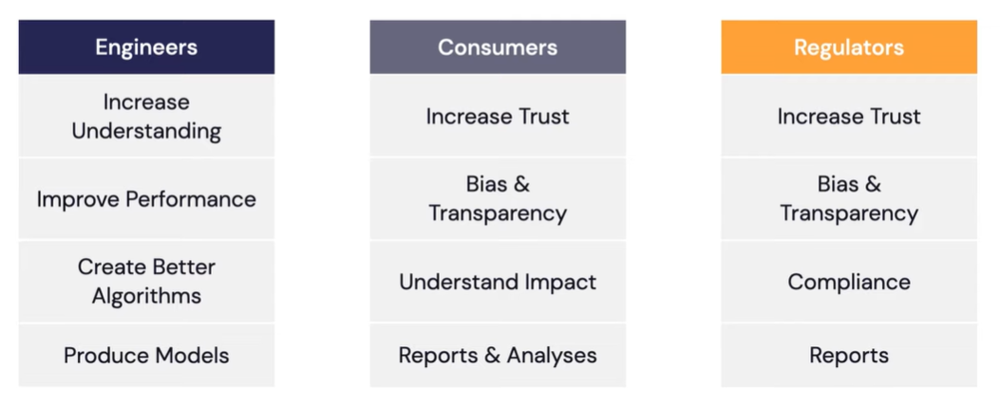

### Feature Importance

In [41]:
np.array(cat_regressor.get_feature_importance(prettified=True))

array([['hour', 30.585666519404644],
       ['hum', 13.653807529453655],
       ['d_point', 5.660986758597055],
       ['wind_spd', 4.855480456953399],
       ['wind_deg', 4.497932237721139],
       ['temp_range', 4.213013404223508],
       ['year', 4.058098896928809],
       ['month', 3.9093960787111603],
       ['clouds', 3.390990945632285],
       ['max_temp', 3.0922109480572426],
       ['min_temp', 2.706189232528964],
       ['prssr', 2.613613795157919],
       ['day', 2.4784774963567524],
       ['temp', 2.2352857813780855],
       ['feels', 2.213672108803439],
       ['weekday_sin', 0.9460568066655531],
       ['sea_level_deviation_code', 0.8473878911313152],
       ['grnd_level_deviation_code', 0.7896122233434114],
       ['season_deviation_code', 0.775827410731985],
       ['visibility_deviation_code', 0.7168340178032012],
       ['season_impact_code', 0.7147579140485945],
       ['sea_level_impact_code', 0.7119671790659358],
       ['weekday_cos', 0.6056231842076752],
       

### SHAP (SHapley Additive exPlanations)

In [42]:
#pip install shap

In [43]:
import shap
from catboost import Pool

shap_values = cat_regressor.get_feature_importance(Pool(X_test, label=y_test), type="ShapValues")
shap_values = shap_values[:,:-1]

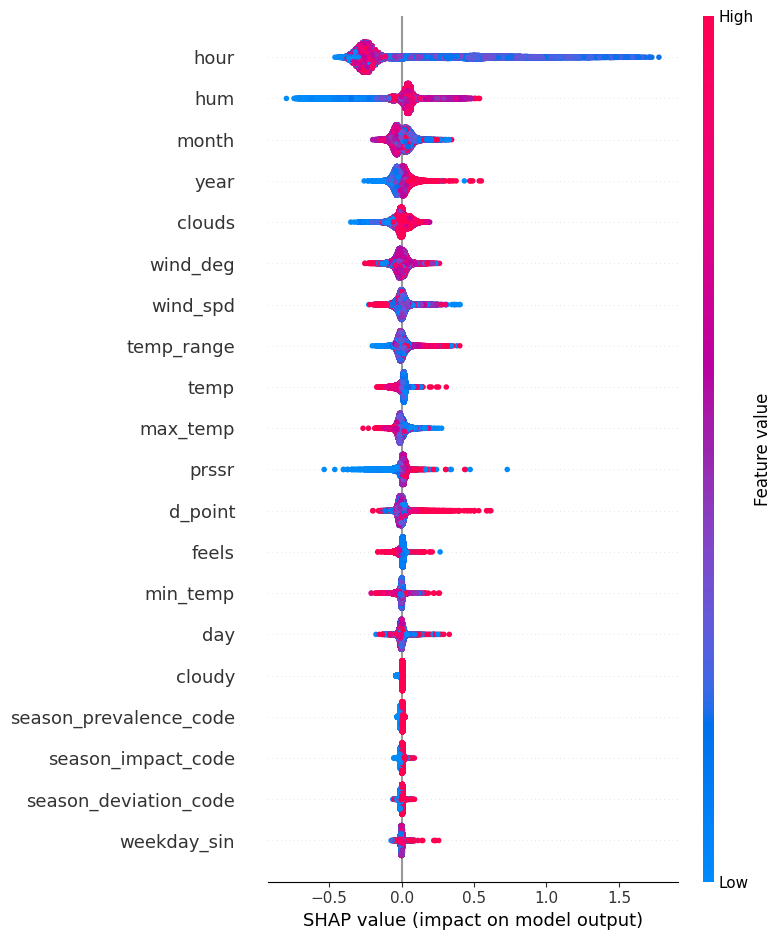

In [44]:
shap.summary_plot(shap_values, X_test)

### LIME (Local Interpretable Model-Agnostic Explanations)

In [45]:
#pip install lime

In [46]:
import lime
from lime.lime_tabular import LimeTabularExplainer

# Submission

In [47]:
submission = pd.read_csv(SAMPLE_SUBMISSION_PATH)

In [48]:
cat_y_pred = cat_regressor.predict(transformed_test)
xgb_y_pred = xgb_regressor.predict(transformed_test)
lgbm_y_pred = lgbm_regressor.predict(transformed_test)

ensembled_y_pred = (
   ( 0.6 * cat_y_pred ) +
   ( 0.1 * xgb_y_pred ) +
   ( 0.3 * lgbm_y_pred ) 
)

submission['rain_1h'] = ensembled_y_pred
submission['rain_1h'] = submission['rain_1h'].apply(lambda x: 0. if x < 0 else x)
submission.to_csv('submission1_radif.csv', index=False)

<Axes: xlabel='rain_1h', ylabel='Density'>

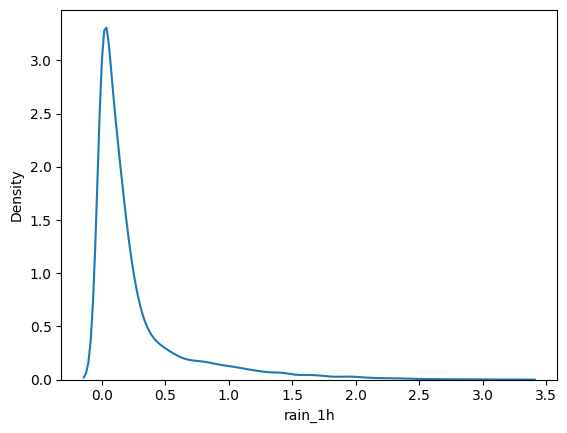

In [49]:
sns.kdeplot(data=submission['rain_1h'])

In [50]:
submission['rain_1h'].describe()

count    49368.000000
mean         0.265967
std          0.405034
min          0.000000
25%          0.025363
50%          0.116550
75%          0.289987
max          3.269101
Name: rain_1h, dtype: float64

## Export

In [51]:
transformed_train.to_csv('exported_train_radif.csv', index=False)
transformed_test.to_csv('exported_test_radif.csv', index=False)

In [52]:
import pickle 

pickle.dump(cat_regressor, open('submission_radif.pkl', 'wb'))